In [3]:
import tensorflow as tf
import rasterio
import glob
import os
import random

import numpy as np
import numpy.ma as ma
import matplotlib.pyplot as plt

from rasterio.features import sieve

from tensorflow import keras
from tensorflow.keras.activations import softmax
from keras import backend as K
from keras.utils import to_categorical
from keras.optimizers import Adam
from tensorflow.keras.layers import Activation, Input, Dense, AveragePooling2D, Conv2D, DepthwiseConv2D
from tensorflow.keras.layers import MaxPooling2D, UpSampling2D, Conv2DTranspose, BatchNormalization, Dropout
from tensorflow.keras.layers import concatenate, Multiply, RandomFlip, RandomRotation, RandomTranslation, RandomCrop
from tensorflow.keras.layers import RandomContrast, RandomBrightness
from tensorflow.keras.models import Model
from tensorflow.keras import backend as K 
from tensorflow.keras import losses
from tensorflow.keras.regularizers import l1, l2
from keras.callbacks import EarlyStopping

from matplotlib.colors import ListedColormap
from time import perf_counter

from typing import Callable, Union

In [13]:
def find_images(image_dir):
    # fetching the filepaths
    paths = []
    
    for path in glob.glob(os.path.join(image_dir, "*.jpg")):
        paths.append(path)
    
    for path in glob.glob(os.path.join(image_dir, "*.JPG")):
        paths.append(path)
    return paths
def load_image(path):
    """ Fetches all the tiffs in the given directory and creates a numpy ndarray of shape (image_count, bands, width, height) from them.
    Returns the array, tiff metadata as list and associated nodatamasks in shape (image_count, width, height)
    Tiffs are assumed to be same size and named {number}.tif starting from 0
    """
    img_count = 1
    
    # Getting the size of the images
    with rasterio.open(path) as src:
        meta = src.meta.copy()
    image_width = meta['width']
    image_height = meta['height']
    # Required for the network
    
    nodata_masks = np.empty((img_count, image_height, image_width), dtype='bool')     
    with rasterio.open(path) as src:
        meta = src.meta.copy()
        meta['dtype'] = 'float32'
        metas = meta
        # Note: rasterio returns shape (bands, width, height)
        img_arr = np.empty((meta['count'], image_height, image_width), dtype='float32')

        # Normalizing the data between 0 and 1. Differing bands have different values so they are processed separately
        # Rasterio follows GDAL convention and starts band numbering from 1
        for band_n in range(1, meta['count'] + 1):
            """There might be slight differences in the nodatamasks between the bands, they are all ANDed together
            to create a mask that covers all the nodata patches in all bands.
            Therefore nodata processing needs to be inside this loop
            """
            nodata_mask = src.read_masks(band_n)

            """Changing the mask to reflect numpy convention instead of gdal.
            Invalid entries have a value of 1 or True, and valid have values of 0 or False. 
            """
            nodata_mask = nodata_mask == 0
            if band_n == 1: 
                nodata_mask_full = nodata_mask
            else:
                nodata_mask_full = np.logical_and(nodata_mask_full, nodata_mask, out=nodata_mask_full)

            #normalization
            band_arr = src.read(band_n)
            band_arr = band_arr.astype('float32')
            # Setting nodatamasks to zero
            band_arr[band_arr == meta['nodata']] = 0
            #band_arr_masked = ma.masked_array(band_arr, mask=nodata_mask)
            # Disabled because the images are rgb
            #minimum = band_arr.min()
            #maximum = band_arr.max()
            maximum = 255
            minimum = 0
            # Prevents dividing with zero if all the values are 0
            #if maximum > 0:
            band_arr = (band_arr - minimum)/ (maximum-minimum)

            img_arr[band_n-1] = band_arr


    #nodata_masks[0] = nodata_mask_full
    # Storing array needs to be created only on the first iteration. 
    # All images are assumed to be same size and dtype, so the meta of the first one is used
    data_arr = np.empty((img_count, meta['count'], meta['height'],  meta['width'] ), dtype=meta['dtype'])
    #data_arr[i] = img_arr
      
    data_arr = np.moveaxis(img_arr, 0, -1)
    #data_arr = np.squeeze(data_arr)
    return data_arr, metas, nodata_mask_full


def SepConv_BN(x, filters, stride=1, kernel_size=3, rate=1, depth_activation=False, epsilon=1e-3):
    """ SepConv with BN between depthwise & pointwise. Optionally add activation after BN
        Implements right "same" padding for even kernel sizes
        Args:
            x: input tensor
            filters: num of filters in pointwise convolution
            prefix: prefix before name
            stride: stride at depthwise conv
            kernel_size: kernel size for depthwise convolution
            rate: atrous rate for depthwise convolution
            depth_activation: flag to use activation between depthwise & poinwise convs
            epsilon: epsilon to use in BN layer
            the code is based on keras implementation of deeplabV3+ https://github.com/bonlime/keras-deeplab-v3-plus
    """

    if stride == 1:
        depth_padding = 'same'
    else:
        kernel_size_effective = kernel_size + (kernel_size - 1) * (rate - 1)
        pad_total = kernel_size_effective - 1
        pad_beg = pad_total // 2
        pad_end = pad_total - pad_beg
        x = ZeroPadding2D((pad_beg, pad_end))(x)
        depth_padding = 'valid'

    if not depth_activation:
        x = Activation('elu')(x)

    x = DepthwiseConv2D((kernel_size, kernel_size), strides=(stride, stride), dilation_rate=(
        rate, rate), padding=depth_padding, use_bias=False)(x)  # depthwise
    x = BatchNormalization(epsilon=epsilon)(x)

    if depth_activation:
        x = Activation('elu')(x)

    x = Conv2D(filters, (1, 1), padding='same', use_bias=False)(x)  # pointwise
    x = BatchNormalization(epsilon=epsilon)(x)

    if depth_activation:
        x = Activation('elu')(x)

    return x



    def call(self, inputs):
        if self.upsampling:
            return K.tf.image.resize_bilinear(inputs, (inputs.shape[1] * self.upsampling[0], inputs.shape[2] * self.upsampling[1]), align_corners=True)
            # return K.tensorflow_backend.tf.image.resize(inputs, (inputs.shape[1] * self.upsampling[0], inputs.shape[2] * self.upsampling[1]))
        else:
            return K.tf.image.resize_bilinear(inputs, (self.output_size[0], self.output_size[1]), align_corners=True)
            # return K.tensorflow_backend.tfimage.resize(inputs, (self.output_size[0], self.output_size[1]))

    def get_config(self):
        config = {'upsampling': self.upsampling,
                  'output_size': self.output_size,
                  'data_format': self.data_format}
        base_config = super(BilinearUpsampling, self).get_config()
        return dict(list(base_config.items()) + list(config.items()))

def multiclass_weighted_cross_entropy(class_weights: list, is_logits: bool = False) -> Callable[[tf.Tensor, tf.Tensor], tf.Tensor]:
    """
    Multi-class weighted cross entropy.

        WCE(p, p̂) = −Σp*log(p̂)*class_weights

    Used as loss function for multi-class image segmentation with one-hot encoded masks.

    :param class_weights: Weight coefficients (list of floats)
    :param is_logits: If y_pred are logits (bool)
    :return: Weighted cross entropy loss function (Callable[[tf.Tensor, tf.Tensor], tf.Tensor])
    """
    # https://github.com/maxvfischer/keras-image-segmentation-loss-functions/blob/master/losses/multiclass_losses.py#L42
    if not isinstance(class_weights, tf.Tensor):
        class_weights = tf.constant(class_weights)

    def loss(y_true: tf.Tensor, y_pred: tf.Tensor) -> tf.Tensor:
        """
        Computes the weighted cross entropy.

        :param y_true: Ground truth (tf.Tensor, shape=(None, None, None, None))
        :param y_pred: Predictions (tf.Tensor, shape=(<BATCH_SIZE>, <IMAGE_HEIGHT>, <IMAGE_WIDTH>, <N_CLASSES>))
        :return: Weighted cross entropy (tf.Tensor, shape=(<BATCH_SIZE>,))
        """
        assert len(class_weights) == y_pred.shape[-1], f"Number of class_weights ({len(class_weights)}) needs to be the same as number " \
                                                 f"of classes ({y_pred.shape[-1]})"
        
        
        if is_logits:
            y_pred = softmax(y_pred, axis=-1)
        #tf.cast(y_pred, tf.float32)
        y_pred = K.clip(y_pred, K.epsilon(), 1-K.epsilon())  # To avoid unwanted behaviour in K.log(y_pred)

        # p * log(p̂) * class_weights
        wce_loss = y_true * K.log(y_pred) * class_weights

        # Average over each data point/image in batch
        axis_to_reduce = range(1, K.ndim(wce_loss))
        wce_loss = K.mean(wce_loss, axis=axis_to_reduce)

        return -wce_loss

    return loss

def create_sidiwu_models(n_channels=3, shape=256, num_classes=4):

    image_shape = (shape, shape, n_channels)
    num_filters = 16
    OS = 16
    atrous_rates = (3, 6, 9)

    def create_classifier_original():

        inputs = Input(shape=image_shape, name="class_input")
        
        # Data augmentation
        #x = RandomFlip()(inputs)
        
        # Rotation cannot be too large because swamp lines are vertical. This should be about 18 degrees
        #x = RandomRotation((-0.05, 0.05))(x)
        #x = RandomTranslation(0.1, 0.1, fill_mode='wrap')(x)
        #x = RandomContrast(0.05)(x)
        #x = RandomBrightness(0.05)(x)
        
        # 256
        c1 = Conv2D(num_filters, (3, 3),
                    kernel_initializer='he_normal', padding='same')(inputs)
        c1 = BatchNormalization()(c1)
        c1 = Activation('elu')(c1)
        c1 = Dropout(0.1)(c1)
        c1 = Conv2D(num_filters, (3, 3),
                    kernel_initializer='he_normal', padding='same')(c1)
        c1 = BatchNormalization()(c1)
        c1 = Activation('elu')(c1)
        p1 = MaxPooling2D((2, 2))(c1)

        # 128
        c2 = Conv2D(num_filters * 2, (3, 3),
                    kernel_initializer='he_normal', padding='same')(p1)
        c2 = BatchNormalization()(c2)
        c2 = Activation('elu')(c2)
        c2 = Dropout(0.1)(c2)
        c2 = Conv2D(num_filters * 2, (3, 3),
                    kernel_initializer='he_normal', padding='same')(c2)
        c2 = BatchNormalization()(c2)
        c2 = Activation('elu')(c2)
        p2 = MaxPooling2D((2, 2))(c2)

        # 64
        c3 = Conv2D(num_filters * 4, (3, 3),
                    kernel_initializer='he_normal', padding='same')(p2)
        c3 = BatchNormalization()(c3)
        c3 = Activation('elu')(c3)
        c3 = Dropout(0.2)(c3)
        c3 = Conv2D(num_filters * 4, (3, 3),
                    kernel_initializer='he_normal', padding='same')(c3)
        c3 = BatchNormalization()(c3)
        c3 = Activation('elu')(c3)
        p3 = MaxPooling2D((2, 2))(c3)

        # 32
        c4 = Conv2D(num_filters * 8, (3, 3),
                    kernel_initializer='he_normal', padding='same')(p3)
        c4 = BatchNormalization()(c4)
        c4 = Activation('elu')(c4)
        c4 = Dropout(0.2)(c4)
        c4 = Conv2D(num_filters * 8, (3, 3),
                    kernel_initializer='he_normal', padding='same')(c4)
        c4 = BatchNormalization()(c4)
        c4 = Activation('elu')(c4)
        p4 = MaxPooling2D(pool_size=(2, 2))(c4)

        # 16
        c5 = Conv2D(num_filters * 16, (3, 3),
                    kernel_initializer='he_normal', padding='same')(p4)
        c5 = BatchNormalization()(c5)
        c5 = Activation('elu')(c5)
        c5 = Dropout(0.3)(c5)
        c5 = Conv2D(num_filters * 16, (3, 3),
                    kernel_initializer='he_normal', padding='same')(c5)
        c5 = BatchNormalization()(c5)
        c5 = Activation('elu')(c5)

        # ASPP
        # Image Feature branch
        #out_shape = int(np.ceil(input_shape[0] / OS))
        b4 = AveragePooling2D(pool_size=(
            int(np.ceil(image_shape[0] / OS)), int(np.ceil(image_shape[1] / OS))))(c5)
        b4 = Conv2D(256, (1, 1), padding='same', use_bias=False)(b4)
        b4 = BatchNormalization(epsilon=1e-5)(b4)
        b4 = Activation('elu')(b4)
        b4 = UpSampling2D((18, 18,), interpolation='bilinear')(b4)

        # simple 1x1
        b0 = Conv2D(256, (1, 1), padding='same', use_bias=False)(c5)
        b0 = BatchNormalization(epsilon=1e-5)(b0)
        b0 = Activation('elu')(b0)
        #rate = 3 (6)
        b1 = SepConv_BN(
            c5, 256, rate=atrous_rates[0], depth_activation=False, epsilon=1e-5)
        # rate = 6 (12)
        b2 = SepConv_BN(
            c5, 256, rate=atrous_rates[1], depth_activation=False, epsilon=1e-5)
        # rate = 9 (18)
        b3 = SepConv_BN(
            c5, 256, rate=atrous_rates[2], depth_activation=False, epsilon=1e-5)

        # concatenate ASPP branches & project
        c5 = concatenate([b4, b0, b1, b2, b3])

        # simple 1x1 again
        c5 = Conv2D(256, (1, 1), padding='same', use_bias=False)(c5)

        c5 = BatchNormalization(epsilon=1e-5)(c5)
        c5 = Activation('elu')(c5)
        c5 = Dropout(0.1)(c5)

        # 32
        u6 = Conv2DTranspose(num_filters * 8, (2, 2),
                             strides=(2, 2), padding='same')(c5)
        u6 = concatenate([u6, c4])
        c6 = Conv2D(num_filters * 8, (3, 3),
                    kernel_initializer='he_normal', padding='same')(u6)
        c6 = BatchNormalization()(c6)
        c6 = Activation('elu')(c6)
        c6 = Dropout(0.2)(c6)
        c6 = Conv2D(num_filters * 8, (3, 3),
                    kernel_initializer='he_normal', padding='same')(c6)
        c6 = BatchNormalization()(c6)
        c6 = Activation('elu')(c6)

        # 64
        u7 = Conv2DTranspose(num_filters * 4, (2, 2),
                             strides=(2, 2), padding='same')(c6)
        u7 = concatenate([u7, c3])
        c7 = Conv2D(num_filters * 4, (3, 3),
                    kernel_initializer='he_normal', padding='same')(u7)
        c7 = BatchNormalization()(c7)
        c7 = Activation('elu')(c7)
        c7 = Dropout(0.2)(c7)
        c7 = Conv2D(num_filters * 4, (3, 3),
                    kernel_initializer='he_normal', padding='same')(c7)
        c7 = BatchNormalization()(c7)
        c7 = Activation('elu')(c7)

        # 128
        u8 = Conv2DTranspose(num_filters * 2, (2, 2),
                             strides=(2, 2), padding='same')(c7)
        u8 = concatenate([u8, c2])
        c8 = Conv2D(num_filters * 2, (3, 3),
                    kernel_initializer='he_normal', padding='same')(u8)
        c8 = BatchNormalization()(c8)
        c8 = Activation('elu')(c8)
        c8 = Dropout(0.1)(c8)
        c8 = Conv2D(num_filters * 2, (3, 3),
                    kernel_initializer='he_normal', padding='same')(c8)
        c8 = BatchNormalization()(c8)
        c8 = Activation('elu')(c8)

        # 256
        u9 = Conv2DTranspose(num_filters, (2, 2),
                             strides=(2, 2), padding='same')(c8)
        u9 = concatenate([u9, c1])
        c9 = Conv2D(num_filters, (3, 3),
                    kernel_initializer='he_normal', padding='same')(u9)
        c9 = BatchNormalization()(c9)
        c9 = Activation('elu')(c9)
        c9 = Dropout(0.1)(c9)
        c9 = Conv2D(num_filters, (3, 3),
                    kernel_initializer='he_normal', padding='same')(c9)
        c9 = BatchNormalization()(c9)
        c9 = Activation('elu')(c9)

        # per-class predictions + per-class uncertainty
        finalConv = Conv2D(num_classes, (1, 1), activation='softmax')(c9)

        model = Model(inputs=inputs, outputs=finalConv, name="classifier")

        return model

    classifier = create_classifier_original()
    return classifier
"""
def padding_length(sheet_width, tile_width=img_width):
    modulo = sheet_width % img_width 
    if modulo != 0:
        padded_width = sheet_width - modulo + 288
    else:
        padded_width = sheet_width
    
    padding_width = padded_width - sheet_width
    return padding_width
"""

def padding_length(sheet_width, tile_width=288, overlap=0):
    """ Returns the required padding length for tiling with given tile size and padding
    """
    """With the overlaps the first column and first row take space equal to img_width to either direction (0th is an exception),
    all the following tiles require a bit less space
    """
    modulo = (sheet_width - tile_width) % (tile_width - 2 * overlap)
    if modulo != 0:
        padded_width = sheet_width - modulo + 284
    else:
        padded_width = sheet_width 
    padding_width = padded_width - sheet_width
    return padding_width

def digitize_image_debug(model, source_path, destination_path, tile_width=288, tile_height=288, overlap=32):
    
    image, meta, nodata_mask = load_image(source_path)

    band_count=image.shape[-1]


    """ Padding is added so that the sheet can be nicely sliced into overlapping tiles.
    """
    padding_width = padding_length(image.shape[1], overlap=overlap)
    padding_height = padding_length(image.shape[0], overlap=overlap)
    
    padded_image = np.pad(image, ((0, padding_height), (0, padding_width), (0, 0)))
    tile_y_count = ((padded_image.shape[0] - tile_width) // (tile_width - overlap * 2)) +1
    tile_x_count = ((padded_image.shape[1] - tile_height) // (tile_height - overlap * 2)) +1


    """ Tiling the image to smaller tiles that are the right shape for the model
    """
    tiles = np.empty((tile_x_count * tile_y_count, tile_width, tile_height, 3), dtype='float32')
    x_left = 0
    y_top = 0
    i = 0
    for tile_y in range(tile_y_count):
        y_bottom = y_top + tile_height
        
        for tile_x in range(tile_x_count):
            x_right = x_left + tile_width
    
            #print(x_left, x_right, y_top, y_bottom)
            tiles[i] = padded_image[y_top : y_bottom, x_left : x_right, :]
            # The x index needs to reset if it has reached the right end
            if x_right < image.shape[1]:
                x_left += tile_width - overlap * 2
            else:
                x_left = 0
            i += 1
            
        y_top += tile_height - overlap * 2 

    # Actual prediction
    prediction = loaded_model.predict(tiles)

    """Parsing the images back to sheet, dropping the edges of the tile from the width of overlap. 
    This retains only the high quality center. Edges of sheet are not cropped
    """
    prediction_sheet = np.empty((padded_image.shape[0], padded_image.shape[1], 4), dtype='float32')
    x_left = 0
    y_top = 0
    i = 0
    for tile_y in range(tile_y_count):
        y_bottom = y_top + tile_height
        # First tile rows top is not cropped, instead it accepted that there may be some artefacts at the sheet edges
        if y_top == 0:
                y_top_clip = y_top
                top_overlap = 0
        else:
            y_top_clip = y_top + overlap
            top_overlap = overlap
        # last tile rows bottom is not cropped, instead it accepted that there may be some artefacts at the sheet edges
        if y_bottom == tile_y_count - 1:
            y_bottom_clip = y_bottom
            bottom_overlap = 0
        else:
            y_bottom_clip = y_bottom - overlap
            bottom_overlap = overlap
        for tile_x in range(tile_x_count):
            x_right = x_left + tile_width
    
            # First tile columns left side is not cropped, instead it accepted that there may be some artefacts at the sheet edges
            if x_left == 0:
                x_left_clip = x_left
                left_overlap = 0
            else:
                x_left_clip = x_left + overlap
                left_overlap = overlap
            # Last tile columns right side is not cropped, instead it accepted that there may be some artefacts at the sheet edges
            if x_right == tile_x_count - 1:
                x_right_clip = x_right
                right_overlap = 0
            else:
                x_right_clip = x_right - overlap
                right_overlap = overlap
    
          
            
            #print(x_left, x_right, y_top, y_bottom)
            # Setting the cropped image to right location on the sheet.
            prediction_sheet[y_top_clip : y_bottom_clip, x_left_clip : x_right_clip, :] = prediction[i, top_overlap : -bottom_overlap, left_overlap : -right_overlap, :]
            # The x index needs to reset if it has reached the right end
            if x_right < image.shape[1]:
                x_left += tile_width - overlap * 2
            else:
                x_left = 0
            i += 1
            
        y_top += tile_height - overlap * 2


    # Cropping away the padding
    cropped_sheet = prediction_sheet[0 : image.shape[0], 0 : image.shape[1], :]
    classified_sheet = np.argmax(cropped_sheet, axis=-1).astype('uint8')
    """ smallest areas in the map are approximately 20–30 m wide (smallest areas should be 3 mm on 1:10000).
    20 / 1,69 = 11 px rounded down, which is smaller than problematic cliff markings (triangle of about size 15m x 15m). 
    11 x 11 pixels is 121 pixels
    """
    sieved_sheet = rasterio.features.sieve(classified_sheet, size=121)
    # Todo some filtering on the nodata mask
    # change metadata nodata and possibly other things.
    #TODO save image
    
    # Nodatamask may (does) have small areas at the edges and internal parts where there are small regions of nodata, this removes them
    sieved_nodata_mask = sieve(nodata_mask.astype('uint8'), 1000)
    # changing the nodata to 255
    sieved_nodata_mask = np.where(sieved_nodata_mask == 1, 255, 0)
    masked_image = np.where(sieved_nodata_mask == 255, 255, sieved_sheet)

    # Stupidly, rasterio needs the band count inculded in the shape, even if it is just one 
    final_image = np.expand_dims(masked_image, 0)

    meta['nodata'] = 255
    meta['count'] = 1
    meta['dtype'] = 'uint8'
    meta['driver'] = 'GTiff'
    
    return final_image, meta, prediction_sheet
    #with rasterio.open(destination_path, 'w', **meta, compress="LZW") as dest:
                #dest.write(final_image)

def digitize_image(model, source_path, destination_path, tile_width=288, tile_height=288, overlap=32):
    
    image, meta, nodata_mask = load_image(source_path)

    band_count=image.shape[-1]


    """ Padding is added so that the sheet can be nicely sliced into overlapping tiles.
    """
    padding_width = padding_length(image.shape[1], overlap=overlap)
    padding_height = padding_length(image.shape[0], overlap=overlap)
    
    padded_image = np.pad(image, ((0, padding_height), (0, padding_width), (0, 0)))
    tile_y_count = ((padded_image.shape[0] - tile_width) // (tile_width - overlap * 2)) +1
    tile_x_count = ((padded_image.shape[1] - tile_height) // (tile_height - overlap * 2)) +1


    """ Tiling the image to smaller tiles that are the right shape for the model
    """
    tiles = np.empty((tile_x_count * tile_y_count, tile_width, tile_height, 3), dtype='float32')
    x_left = 0
    y_top = 0
    i = 0
    for tile_y in range(tile_y_count):
        y_bottom = y_top + tile_height
        
        for tile_x in range(tile_x_count):
            x_right = x_left + tile_width
    
            #print(x_left, x_right, y_top, y_bottom)
            tiles[i] = padded_image[y_top : y_bottom, x_left : x_right, :]
            # The x index needs to reset if it has reached the right end
            if x_right < image.shape[1]:
                x_left += tile_width - overlap * 2
            else:
                x_left = 0
            i += 1
            
        y_top += tile_height - overlap * 2 

    # Actual prediction
    prediction = loaded_model.predict(tiles)

    """Parsing the images back to sheet, dropping the edges of the tile from the width of overlap. 
    This retains only the high quality center. Edges of sheet are not cropped
    """
    prediction_sheet = np.empty((padded_image.shape[0], padded_image.shape[1], 4), dtype='float32')
    x_left = 0
    y_top = 0
    i = 0
    for tile_y in range(tile_y_count):
        y_bottom = y_top + tile_height
        # First tile rows top is not cropped, instead it accepted that there may be some artefacts at the sheet edges
        if y_top == 0:
                y_top_clip = y_top
                top_overlap = 0
        else:
            y_top_clip = y_top + overlap
            top_overlap = overlap
        # last tile rows bottom is not cropped, instead it accepted that there may be some artefacts at the sheet edges
        if y_bottom == tile_y_count - 1:
            y_bottom_clip = y_bottom
            bottom_overlap = 0
        else:
            y_bottom_clip = y_bottom - overlap
            bottom_overlap = overlap
        for tile_x in range(tile_x_count):
            x_right = x_left + tile_width
    
            # First tile columns left side is not cropped, instead it accepted that there may be some artefacts at the sheet edges
            if x_left == 0:
                x_left_clip = x_left
                left_overlap = 0
            else:
                x_left_clip = x_left + overlap
                left_overlap = overlap
            # Last tile columns right side is not cropped, instead it accepted that there may be some artefacts at the sheet edges
            if x_right == tile_x_count - 1:
                x_right_clip = x_right
                right_overlap = 0
            else:
                x_right_clip = x_right - overlap
                right_overlap = overlap
    
          
            
            #print(x_left, x_right, y_top, y_bottom)
            # Setting the cropped image to right location on the sheet.
            prediction_sheet[y_top_clip : y_bottom_clip, x_left_clip : x_right_clip, :] = prediction[i, top_overlap : -bottom_overlap, left_overlap : -right_overlap, :]
            # The x index needs to reset if it has reached the right end
            if x_right < image.shape[1]:
                x_left += tile_width - overlap * 2
            else:
                x_left = 0
            i += 1
            
        y_top += tile_height - overlap * 2


    # Cropping away the padding
    cropped_sheet = prediction_sheet[0 : image.shape[0], 0 : image.shape[1], :]
    classified_sheet = np.argmax(cropped_sheet, axis=-1).astype('uint8')
    """ smallest areas in the map are approximately 20–30 m wide (smallest areas should be 3 mm on 1:10000).
    20 / 1,69 = 11 px rounded down, which is smaller than problematic cliff markings (triangle of about size 15m x 15m). 
    11 x 11 pixels is 121 pixels
    """
    sieved_sheet = rasterio.features.sieve(classified_sheet, size=121)
    # Todo some filtering on the nodata mask
    # change metadata nodata and possibly other things.
    #TODO save image
    
    # Nodatamask may (does) have small areas at the edges and internal parts where there are small regions of nodata, this removes them
    sieved_nodata_mask = sieve(nodata_mask.astype('uint8'), 1000)
    # changing the nodata to 255
    sieved_nodata_mask = np.where(sieved_nodata_mask == 1, 255, 0)
    masked_image = np.where(sieved_nodata_mask == 255, 255, sieved_sheet)

    # Stupidly, rasterio needs the band count inculded in the shape, even if it is just one 
    final_image = np.expand_dims(masked_image, 0)

    meta['nodata'] = 255
    meta['count'] = 1
    meta['dtype'] = 'uint8'
    meta['driver'] = 'GTiff'
    
    with rasterio.open(destination_path, 'w', **meta, compress="LZW") as dest:
                dest.write(final_image)
            
def convert_sec(seconds):
    """ Prints pretty seconds
    """
    seconds = seconds % (24 * 3600)
    hour = seconds // 3600
    seconds %= 3600
    minutes = seconds // 60
    seconds %= 60
     
    return "%d:%02d:%02d" % (hour, minutes, seconds)

In [7]:
tf.get_logger().setLevel('ERROR')

# Fossa paths
#Geotiff image folder, containing the trainingdata.
source_img_dir = "/tf/Koulutyöt/Gradu/data/clip_kartat/newer_v2"
dest_img_dir = "/tf/Koulutyöt/Gradu/data/testilehti/prosessoitu"


#Yoga paths
#Geotiff image folder, containing the trainingdata.
#source_img_dir = "/home/iiro/Documents/Koulutyöt/Gradu/data/testilehti/"

# A good value for the used dataset, may change depending on the data
#num_classes = 4
plt.rcParams['figure.dpi'] = 300

tile_width= 288
model_path = "/tf/Koulutyöt/Gradu/data/malli"
"""
loaded_model = create_sidiwu_models(shape=tile_width)
loaded_model.compile(
    optimizer=Adam(),
    loss=multiclass_weighted_cross_entropy([1.0, 7.3, 11.5, 7.2]))
checkpoint = loaded_model.load_weights(model_path)
"""

'\nloaded_model = create_sidiwu_models(shape=tile_width)\nloaded_model.compile(\n    optimizer=Adam(),\n    loss=multiclass_weighted_cross_entropy([1.0, 7.3, 11.5, 7.2]))\ncheckpoint = loaded_model.load_weights(model_path)\n'

In [4]:
paths = find_images(source_img_dir)
assert len(paths) > 0 , "Give a valid path with images"
path_count = len(paths)
successfull = []
unsuccessfull = []
start_time = perf_counter()
for i, path in enumerate(paths):
    loop_start_time = perf_counter()
    
    # Here because of memory leak somewhere, maybe in model.predict. Adds a few seconds of prosessing time
    loaded_model = create_sidiwu_models(shape=tile_width)
    loaded_model.compile(
        optimizer=Adam(),
        loss=multiclass_weighted_cross_entropy([1.0, 7.3, 11.5, 7.2]))
    checkpoint = loaded_model.load_weights(model_path)
    
    
    
    filename = os.path.basename(path)
    filename_tiff = filename[:-4] + ".tif"
    dest_path = os.path.join(dest_img_dir, filename_tiff)
    try:
        digitize_image(loaded_model, path, dest_path)
        successfull.append(path)
    except Exception as error:
        print(error)
        unsuccessfull.append((path, error))
    
    loop_end_time = perf_counter()
    total_time = round((loop_end_time - start_time), 1)
    print(f"{i + 1} / {path_count} processed in {convert_sec(total_time)}")
    print(f"loop was processed in {convert_sec(loop_end_time - loop_start_time)}")
    print(f"Estimated time remaining:\n\
{convert_sec((total_time / (i + 1)) * (path_count - i -1))}")

25/25 [==============================] - 5s 52ms/step
1 / 368 processed in 0:00:11
loop was processed in 0:00:11
Estimated time remaining:
1:10:20
31/31 [==============================] - 2s 55ms/step
2 / 368 processed in 0:00:21
loop was processed in 0:00:10
Estimated time remaining:
1:06:11
25/25 [==============================] - 1s 40ms/step
3 / 368 processed in 0:00:29
loop was processed in 0:00:08
Estimated time remaining:
1:00:13
23/23 [==============================] - 2s 62ms/step
4 / 368 processed in 0:00:37
loop was processed in 0:00:07
Estimated time remaining:
0:56:43
27/27 [==============================] - 2s 53ms/step
5 / 368 processed in 0:00:46
loop was processed in 0:00:08
Estimated time remaining:
0:55:39
25/25 [==============================] - 1s 40ms/step
6 / 368 processed in 0:00:53
loop was processed in 0:00:07
Estimated time remaining:
0:54:05
23/23 [==============================] - 1s 39ms/step
7 / 368 processed in 0:01:01
loop was processed in 0:00:07
Estim

In [20]:
""""""
# For diagnosing individual sheets
""""""
paths = find_images(source_img_dir)
assert len(paths) > 0 , "Give a valid path with images"
path_count = len(paths)
successfull = []
unsuccessfull = []

path = '/tf/Koulutyöt/Gradu/data/clip_kartat/newer_v2/302402_1964.jpg'
    
loop_start_time = perf_counter()

# Here because of memory leak somewhere, maybe in model.predict. Adds a few seconds of prosessing time
loaded_model = create_sidiwu_models(shape=tile_width)
loaded_model.compile(
    optimizer=Adam(),
    loss=multiclass_weighted_cross_entropy([1.0, 7.3, 11.5, 7.2]))
checkpoint = loaded_model.load_weights(model_path)



filename = os.path.basename(path)
filename_tiff = filename[:-4] + ".tif"
dest_path = os.path.join(dest_img_dir, filename_tiff)
try:
    image, meta, prediction = digitize_image_debug(loaded_model, path, dest_path)
    successfull.append(path)
except Exception as error:
    #print(error)
    unsuccessfull.append((path, error))

print(f"unsuccessfull: {unsuccessfull} ")

22/22 [==============================] - 1s 47ms/step
unsuccessfull: [] 


In [12]:
print(unsuccessfull)

[('/tf/Koulutyöt/Gradu/data/clip_kartat/newer_v2/302402_1964.jpg', InternalError())]


In [86]:
"""
filename = os.path.basename(paths[1])
filename_tiff = filename[:-4] + ".tif"
dest_path = os.path.join(dest_img_dir, filename_tiff)
print(dest_path)
digitize_image(loaded_model, paths[1], dest_path)
"""

/tf/Koulutyöt/Gradu/data/predictions/113310_1969.tif
30/30 [==============================] - 1s 40ms/step


In [5]:
#image, meta, nodata_mask = load_image(paths[1])

(5888, 5948, 4)


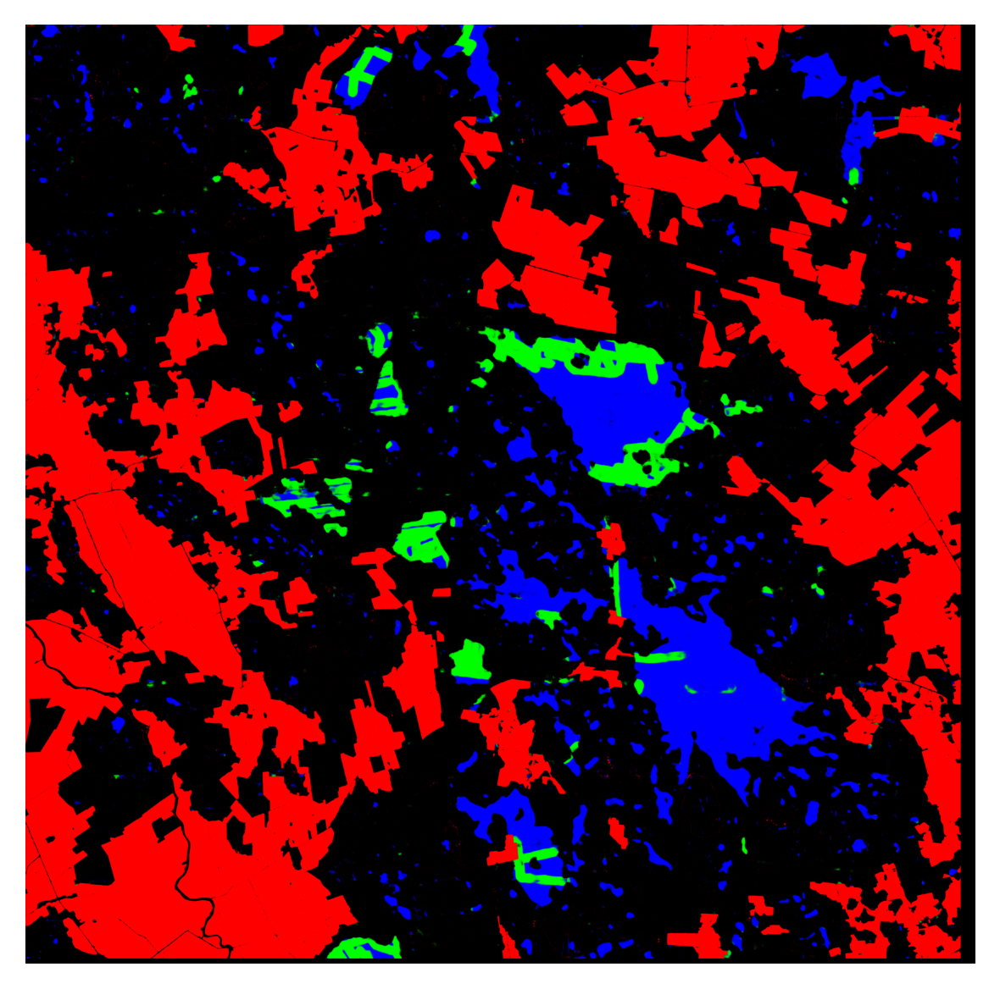

In [33]:
print(prediction.shape)
plot = plt.imshow(prediction[:,:, 1:4])
plt.axis('off')
plt.show()

(1, 5888, 5886)


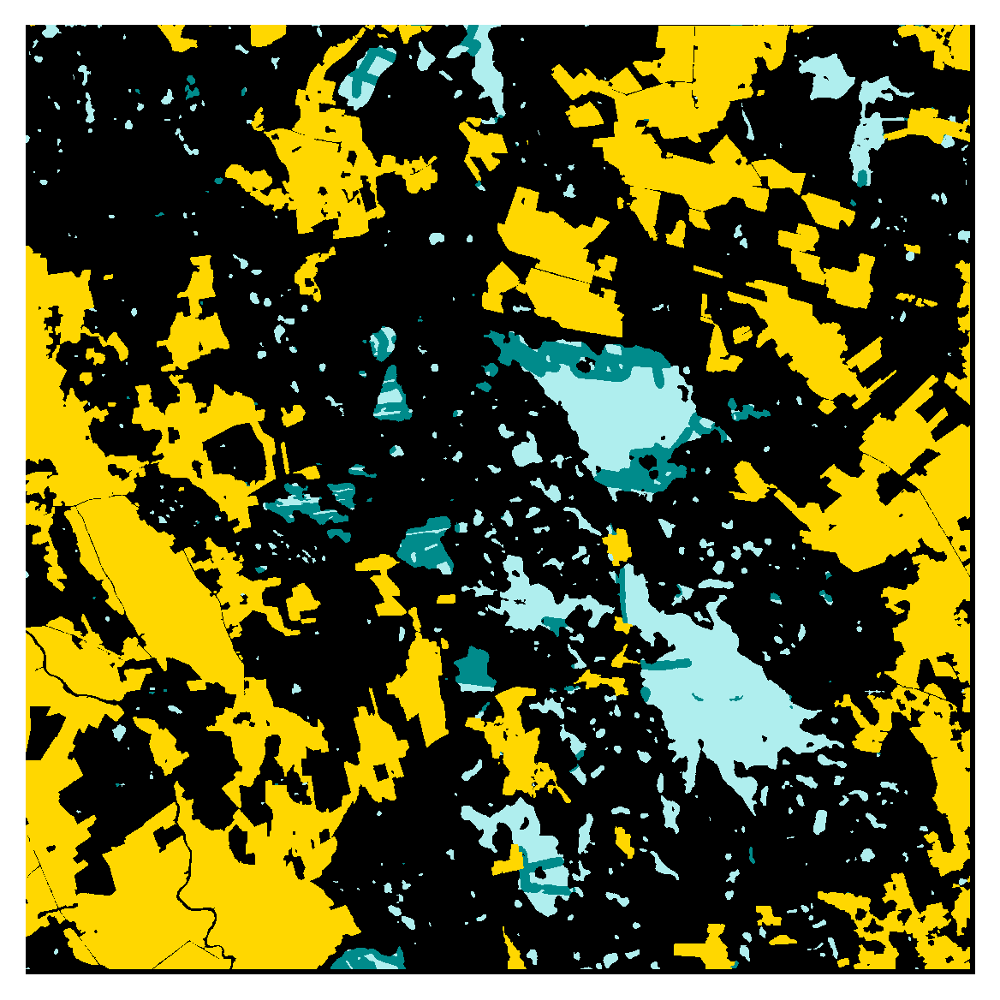

In [31]:
label_cmap=ListedColormap(['black', 'gold', 'darkcyan', 'paleturquoise'])
print(image.shape)
plot = plt.imshow(image[0], cmap=label_cmap, interpolation='none', vmax=4)
plt.axis('off')
plt.show()

In [41]:
# Padding is added so that the sheet can be nicely sliced into overlapping 288 x 288 tiles.
#Must be removed at the end
tile_width = 288
tile_height = 288
band_count=image.shape[-1]

# Tested to produce best combination of quality and speed (and space)
overlap = 32
padding_width = padding_length(image.shape[1], overlap=overlap)
padding_height = padding_length(image.shape[0], overlap=overlap)

padded_image = np.pad(image, ((0, padding_height), (0, padding_width), (0, 0)))
tile_y_count = ((padded_image.shape[0] - tile_width) // (tile_width - overlap * 2)) +1
tile_x_count = ((padded_image.shape[1] - tile_height) // (tile_height - overlap * 2)) +1

tiles = np.empty((tile_x_count * tile_y_count, tile_width, tile_height, 3), dtype='float32')
x_left = 0
y_top = 0
i = 0
for tile_y in range(tile_y_count):
    y_bottom = y_top + tile_height
    
    for tile_x in range(tile_x_count):
        x_right = x_left + tile_width

        #print(x_left, x_right, y_top, y_bottom)
        tiles[i] = padded_image[y_top : y_bottom, x_left : x_right, :]
        # The x index needs to reset if it has reached the right end
        if x_right < image.shape[1]:
            x_left += tile_width - overlap * 2
        else:
            x_left = 0
        i += 1
        
    y_top += tile_height - overlap * 2 

prediction = loaded_model.predict(tiles)

prediction_sheet = np.empty((padded_image.shape[0], padded_image.shape[1], 4), dtype='float32')
x_left = 0
y_top = 0
i = 0
for tile_y in range(tile_y_count):
    y_bottom = y_top + tile_height
    # First tile rows top is not cropped, instead it accepted that there may be some artefacts at the sheet edges
    if y_top == 0:
            y_top_clip = y_top
            top_overlap = 0
    else:
        y_top_clip = y_top + overlap
        top_overlap = overlap
    # last tile rows bottom is not cropped, instead it accepted that there may be some artefacts at the sheet edges
    if y_bottom == tile_y_count - 1:
        y_bottom_clip = y_bottom
        bottom_overlap = 0
    else:
        y_bottom_clip = y_bottom - overlap
        bottom_overlap = overlap
    for tile_x in range(tile_x_count):
        x_right = x_left + tile_width

        # First tile columns left side is not cropped, instead it accepted that there may be some artefacts at the sheet edges
        if x_left == 0:
            x_left_clip = x_left
            left_overlap = 0
        else:
            x_left_clip = x_left + overlap
            left_overlap = overlap
        # Last tile columns right side is not cropped, instead it accepted that there may be some artefacts at the sheet edges
        if x_right == tile_x_count - 1:
            x_right_clip = x_right
            right_overlap = 0
        else:
            x_right_clip = x_right - overlap
            right_overlap = overlap

      
        
        #print(x_left, x_right, y_top, y_bottom)
        # Setting the cropped image to right location on the sheet.
        prediction_sheet[y_top_clip : y_bottom_clip, x_left_clip : x_right_clip, :] = prediction[i, top_overlap : -bottom_overlap, left_overlap : -right_overlap, :]
        # The x index needs to reset if it has reached the right end
        if x_right < image.shape[1]:
            x_left += tile_width - overlap * 2
        else:
            x_left = 0
        i += 1
        
    y_top += tile_height - overlap * 2



30/30 [==============================] - 8s 56ms/step


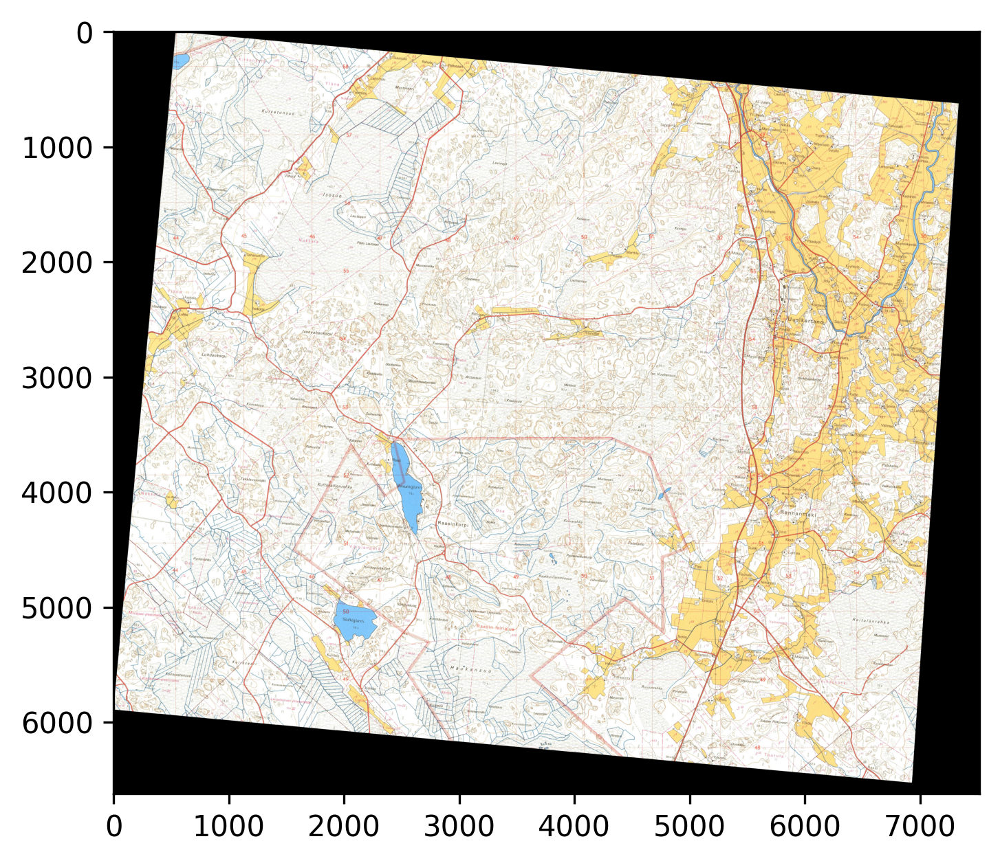

In [42]:
plot = plt.imshow(padded_image)
plt.show()

In [43]:
# Cropping away the padding
cropped_sheet = prediction_sheet[0 : image.shape[0], 0 : image.shape[1], :]
# one hot to categorical numbers
classified_sheet = np.argmax(cropped_sheet, axis=-1).astype('uint8')
""" smallest areas in the map are approximately 20–30 m wide (smallest areas should be 3 mm on 1:10000).
20 / 1,69 = 11 px rounded down, which is smaller than problematic cliff markings (triangle of about size 15m x 15m). 
11 x 11 pixels is 121 pixels
"""
sieved_sheet = rasterio.features.sieve(classified_sheet, size=121)

In [78]:
# Nodatamask may (does) have small areas at the edges and internal parts where there are small regions of nodata, this removes them
sieved_nodata_mask = sieve(nodata_mask.astype('uint8'), 1000)
# changing the nodata to 255
sieved_nodata_mask = np.where(sieved_nodata_mask == 1, 255, 0)
masked_image = np.where(sieved_nodata_mask == 255, 255, sieved_sheet)

# Stupidly, rasterio needs the band count in shape, even if it is just one 
final_image = np.expand_dims(masked_image, 0)

meta['nodata'] = 255
meta['count'] = 1
meta['dtype'] = 'uint8'
meta['driver'] = 'GTiff'
print(meta)

{'driver': 'GTiff', 'dtype': 'uint8', 'nodata': 255, 'width': 7336, 'height': 6525, 'count': 1, 'crs': CRS.from_epsg(3067), 'transform': Affine(1.691456958565457, 0.0, 243017.66799664078,
       0.0, -1.6913762705603266, 6755678.566354683)}


In [71]:
print(final_image.shape)

(1, 6525, 7336)


In [80]:
out_test_path = "/tf/Koulutyöt/Gradu/data/testilehti/prosessoitu/testilehti_113310.tif"
with rasterio.open(out_test_path, 'w', **meta, compress="LZW") as dest:
                dest.write(final_image)

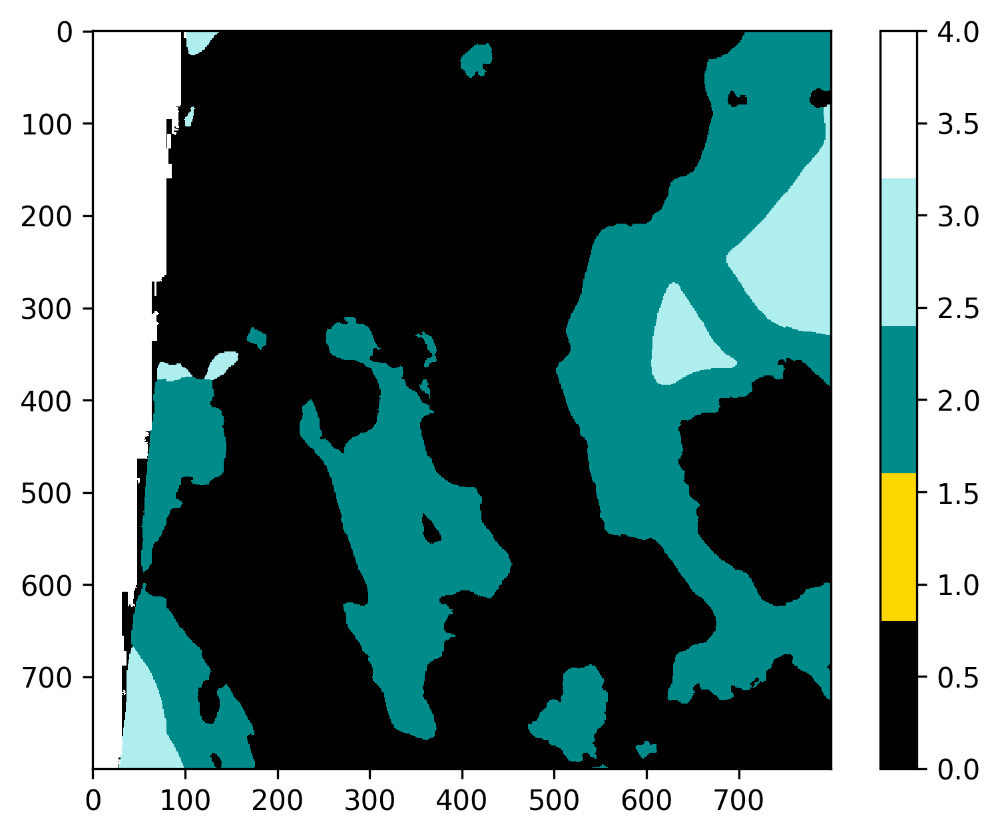

In [76]:
label_cmap=ListedColormap(['black', 'gold', 'darkcyan', 'paleturquoise', 'white'])
plt.imshow(final_image[0, 400:1200, 400:1200], interpolation='none', cmap=label_cmap, vmax=4)
plt.colorbar()
plt.show()



In [ ]:
def digitize_image(model, source_path, destination_path, tile_width=288, tile_height=288, overlap=32):
    
    image, meta, nodata_mask = load_image(source_path)

    band_count=image.shape[-1]


    """ Padding is added so that the sheet can be nicely sliced into overlapping tiles.
    """
    padding_width = padding_length(image.shape[1], overlap=overlap)
    padding_height = padding_length(image.shape[0], overlap=overlap)
    
    padded_image = np.pad(image, ((0, padding_height), (0, padding_width), (0, 0)))
    tile_y_count = ((padded_image.shape[0] - tile_width) // (tile_width - overlap * 2)) +1
    tile_x_count = ((padded_image.shape[1] - tile_height) // (tile_height - overlap * 2)) +1


    """ Tiling the image to smaller tiles that are the right shape for the model
    """
    tiles = np.empty((tile_x_count * tile_y_count, tile_width, tile_height, 3), dtype='float32')
    x_left = 0
    y_top = 0
    i = 0
    for tile_y in range(tile_y_count):
        y_bottom = y_top + tile_height
        
        for tile_x in range(tile_x_count):
            x_right = x_left + tile_width
    
            #print(x_left, x_right, y_top, y_bottom)
            tiles[i] = padded_image[y_top : y_bottom, x_left : x_right, :]
            # The x index needs to reset if it has reached the right end
            if x_right < image.shape[1]:
                x_left += tile_width - overlap * 2
            else:
                x_left = 0
            i += 1
            
        y_top += tile_height - overlap * 2 

    # Actual prediction
    prediction = loaded_model.predict(tiles)

    """Parsing the images back to sheet, dropping the edges of the tile from the width of overlap. 
    This retains only the high quality center. Edges of sheet are not cropped
    """
    prediction_sheet = np.empty((padded_image.shape[0], padded_image.shape[1], 4), dtype='float32')
    x_left = 0
    y_top = 0
    i = 0
    for tile_y in range(tile_y_count):
        y_bottom = y_top + tile_height
        # First tile rows top is not cropped, instead it accepted that there may be some artefacts at the sheet edges
        if y_top == 0:
                y_top_clip = y_top
                top_overlap = 0
        else:
            y_top_clip = y_top + overlap
            top_overlap = overlap
        # last tile rows bottom is not cropped, instead it accepted that there may be some artefacts at the sheet edges
        if y_bottom == tile_y_count - 1:
            y_bottom_clip = y_bottom
            bottom_overlap = 0
        else:
            y_bottom_clip = y_bottom - overlap
            bottom_overlap = overlap
        for tile_x in range(tile_x_count):
            x_right = x_left + tile_width
    
            # First tile columns left side is not cropped, instead it accepted that there may be some artefacts at the sheet edges
            if x_left == 0:
                x_left_clip = x_left
                left_overlap = 0
            else:
                x_left_clip = x_left + overlap
                left_overlap = overlap
            # Last tile columns right side is not cropped, instead it accepted that there may be some artefacts at the sheet edges
            if x_right == tile_x_count - 1:
                x_right_clip = x_right
                right_overlap = 0
            else:
                x_right_clip = x_right - overlap
                right_overlap = overlap
    
          
            
            #print(x_left, x_right, y_top, y_bottom)
            # Setting the cropped image to right location on the sheet.
            prediction_sheet[y_top_clip : y_bottom_clip, x_left_clip : x_right_clip, :] = prediction[i, top_overlap : -bottom_overlap, left_overlap : -right_overlap, :]
            # The x index needs to reset if it has reached the right end
            if x_right < image.shape[1]:
                x_left += tile_width - overlap * 2
            else:
                x_left = 0
            i += 1
            
        y_top += tile_height - overlap * 2


    # Cropping away the padding
    cropped_sheet = prediction_sheet[0 : image.shape[0], 0 : image.shape[1], :]
    classified_sheet = np.argmax(cropped_sheet, axis=-1).astype('uint8')
    """ smallest areas in the map are approximately 20–30 m wide (smallest areas should be 3 mm on 1:10000).
    20 / 1,69 = 11 px rounded down, which is smaller than problematic cliff markings (triangle of about size 15m x 15m). 
    11 x 11 pixels is 121 pixels
    """
    sieved_sheet = rasterio.features.sieve(classified_sheet, size=121)
    # Todo some filtering on the nodata mask
    # change metadata nodata and possibly other things.
    #TODO save image
    
    # Nodatamask may (does) have small areas at the edges and internal parts where there are small regions of nodata, this removes them
    sieved_nodata_mask = sieve(nodata_mask.astype('uint8'), 1000)
    # changing the nodata to 255
    sieved_nodata_mask = np.where(sieved_nodata_mask == 1, 255, 0)
    masked_image = np.where(sieved_nodata_mask == 255, 255, sieved_sheet)

    # Stupidly, rasterio needs the band count inculded in the shape, even if it is just one 
    final_image = np.expand_dims(masked_image, 0)

    meta['nodata'] = 255
    meta['count'] = 1
    meta['dtype'] = 'uint8'
    meta['driver'] = 'GTiff'
    
    with rasterio.open(destination_path, 'w', **meta, compress="LZW") as dest:
                dest.write(final_image)

In [71]:
#plt.imshow(prediction_sheet[:,:, 1:4])
#plt.show()
plt.imsave("/tf/Koulutyöt/Gradu/data/testilehti/prediction_2.png", prediction_sheet[:,:,1:4])

In [79]:
print(prediction_sheet.shape)

(6525, 7336, 4)


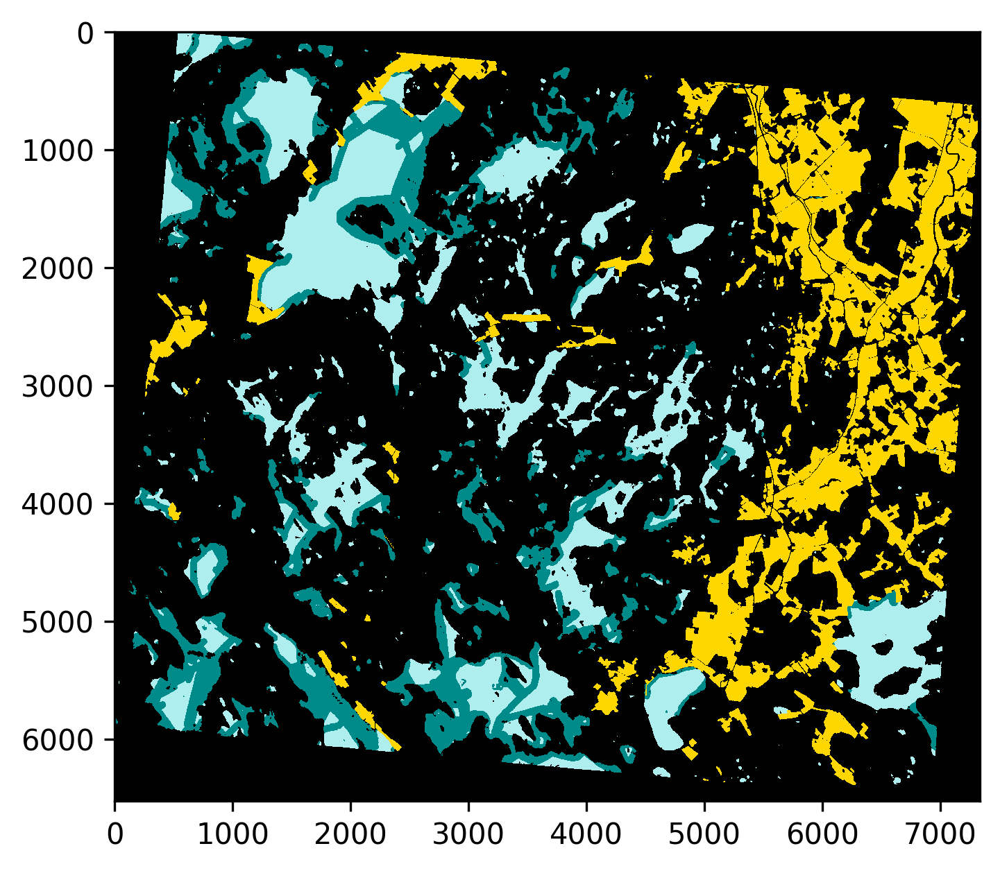

In [85]:

plt.imshow(classified_sheet, cmap=label_cmap, interpolation='none')
plt.show()
#plt.imsave("/tf/Koulutyöt/Gradu/data/testilehti/prediction.png", prediction_sheet[:,:,1:4])

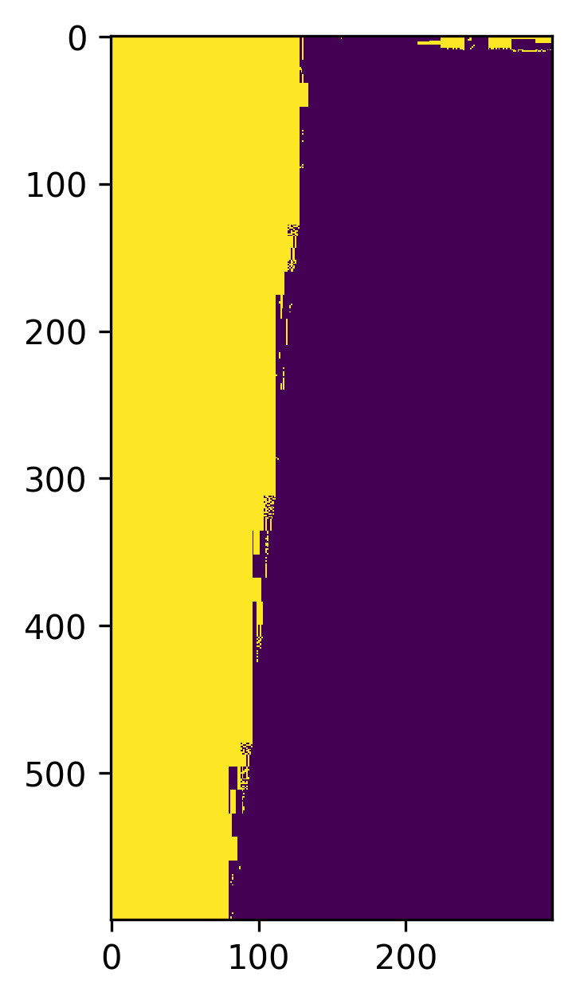

In [29]:
plt.imshow(nodata_mask[0:600, 400:700], interpolation='none')
plt.show()

In [34]:
sieved_nodata_mask = sieve(nodata_mask.astype('uint8'), 1000)

0


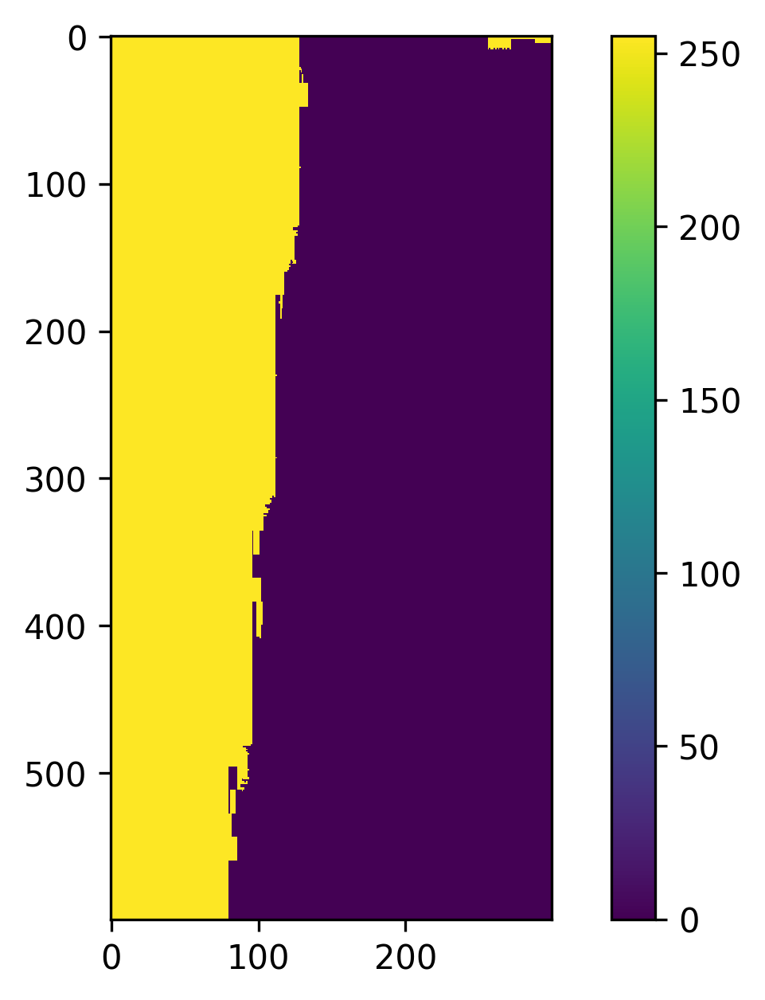

In [45]:
plt.imshow(sieved_nodata_mask[0:600, 400:700], interpolation='none')
plt.colorbar()
plt.show()

In [33]:
print(nodata_mask.dtype)

bool


In [42]:
"""
prediction_sheet = np.empty((padded_image.shape[0], padded_image.shape[1], 4), dtype='float32')
k=0

for x in range (tile_x_count): 
    for y in range(tile_y_count):
        prediction_sheet[x * img_width:(x+1)*img_width, y * img_height:(y+1)*img_height,:] = prediction[k]
        k += 1
"""

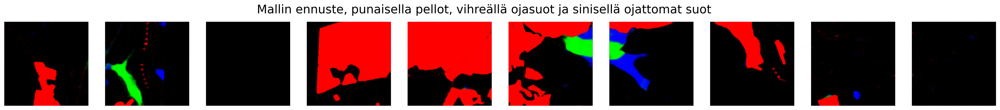

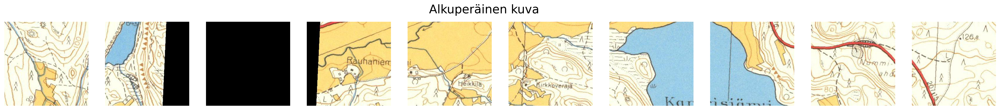

In [40]:
pltsize = 3
test_count = 484

index = random.randint(10, test_count)
#index=79
# Predictions
plt.figure(figsize=(10*pltsize, 3 * pltsize))
for j, i in enumerate(range(index - 10, index)):
    plt.subplot(1,10,j+1)
    plt.axis('off')
    plt.suptitle('Mallin ennuste, punaisella pellot, vihreällä ojasuot ja sinisellä ojattomat suot', y=0.65, size=20)
    plt.imshow(prediction[i,:,:,1:4], vmin=0, vmax=1, interpolation='none')
    #plt.set_cmap('cividis')
    #plt.colorbar(fraction=0.010)
plt.show()

plt.figure(figsize=(10*pltsize, 3 * pltsize))
for j, i in enumerate(range(index - 10, index)):
    plt.subplot(1,10,j+1)
    plt.axis('off')
    plt.suptitle('Alkuperäinen kuva', y=0.65, size=20)
    plt.imshow(tiles[i])
    #plt.set_cmap('viridis')
plt.show()

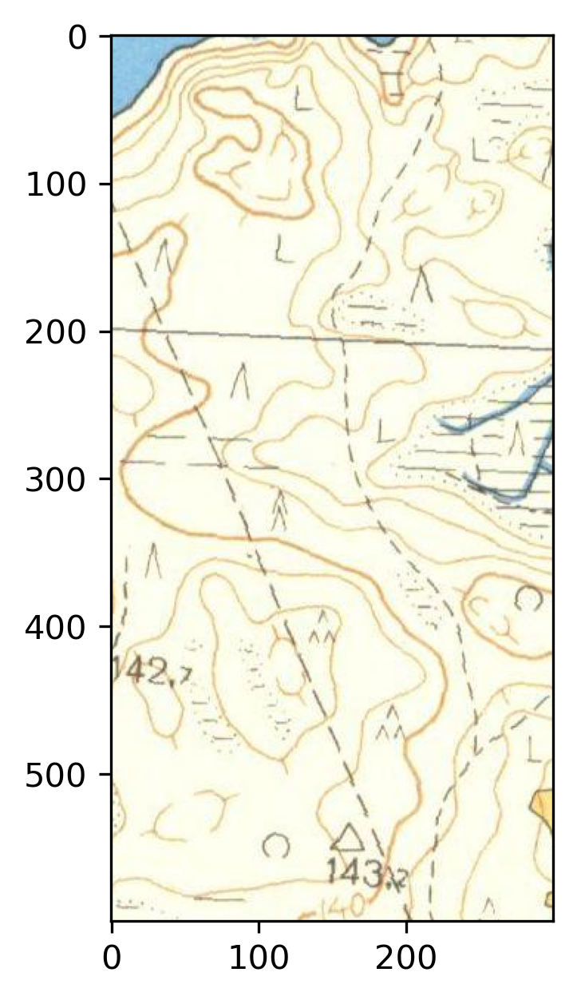

In [16]:
plt.imshow(padded_image[400:1000, 400:700, :])
plt.show()

(725, 288, 288, 3)


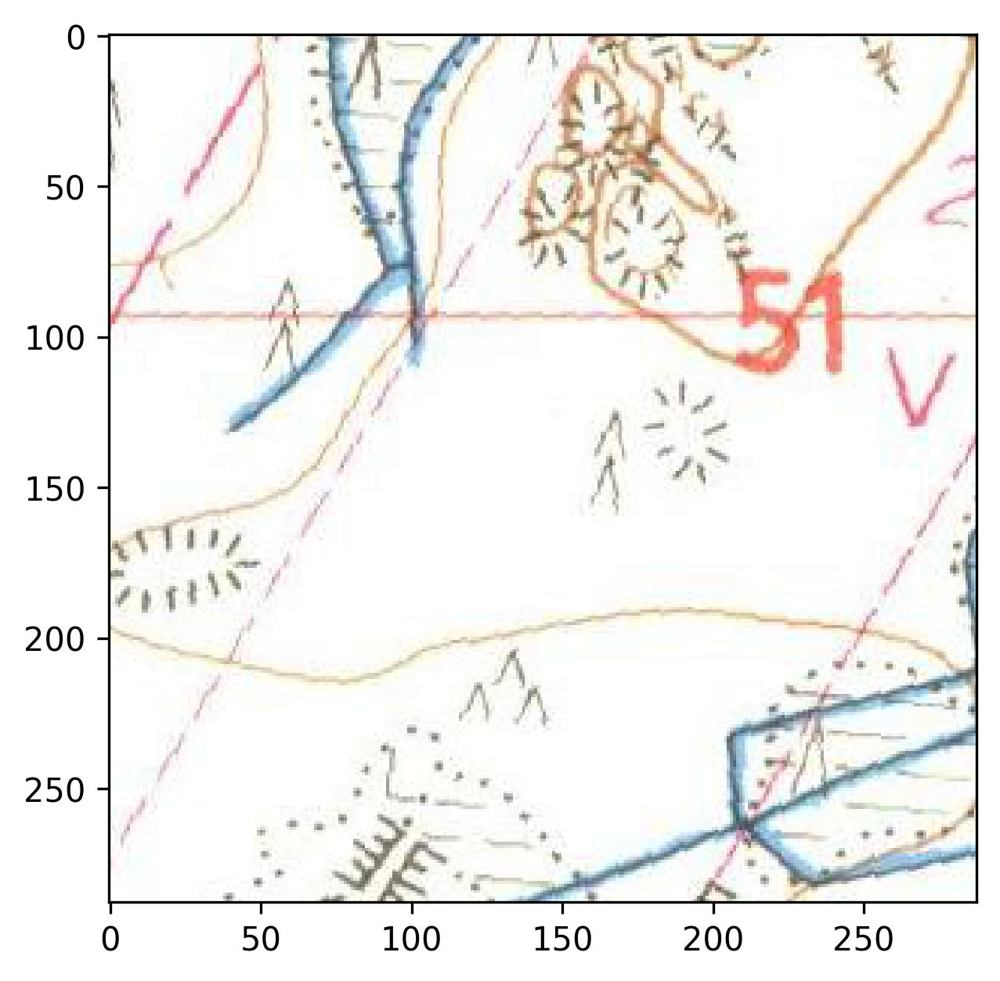

In [39]:
print(tiles.shape)
plt.imshow(tiles[500])
plt.show()

In [26]:
""" old tiling code
tiles = np.empty((tile_x_count * tile_y_count, tile_width, tile_height, 3), dtype='float32')
tile_list = [padded_image[x:x+img_width,y:y+tile_height] for x in range(0,padded_image.shape[0], tile_width) for y in range(0,padded_image.shape[1],tile_height)]

for i in range (tile_x_count * tile_y_count):
    tiles[i] = tile_list[i]

"""